**Topic:** Noise Conditional Score Networks (NCSN): Learning the Score Function


## 0. Setup


In [1]:
import sys, platform, subprocess, importlib, random, os, math, time
from pathlib import Path

print("Python:", sys.version.split()[0])
print("Platform:", platform.platform())

def _ensure(pkg, import_name=None, pip_name=None):
    import_name = import_name or pkg
    pip_name = pip_name or pkg
    try:
        importlib.import_module(import_name)
        print(f"✓ {pip_name} already installed")
    except Exception:
        print(f"Installing {pip_name} ...")
        subprocess.check_call([sys.executable, "-m", "pip", "install", "-q",
                               "torch", "torchvision", "--index-url",
                               "https://download.pytorch.org/whl/cpu"])
        importlib.invalidate_caches()
        importlib.import_module(import_name)
        print(f"✓ {pip_name} installed")

_ensure("torch"); _ensure("torchvision")

import torch, torchvision
from torch import nn, autograd
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchvision.utils import make_grid, save_image

import numpy as np
import matplotlib.pyplot as plt

SEED = 2025
torch.manual_seed(SEED); np.random.seed(SEED); random.seed(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Torch:", torch.__version__)
print("Torchvision:", torchvision.__version__)
print("CUDA available:", torch.cuda.is_available())
print("Device:", DEVICE)


Python: 3.9.25
Platform: Linux-5.15.173-ql-generic-13.0-17-x86_64-with-glibc2.35
✓ torch already installed
✓ torchvision already installed
Torch: 2.5.1
Torchvision: 0.20.1
CUDA available: True
Device: cuda



## 1. Configuration


In [2]:
CFG = {
    "dataset": "TinyImageNet",           # "MNIST" or "FashionMNIST"
    "data_dir": "./data",
    "batch_size": 128,
    "epochs": 100,                  # increase on GPU
    "lr": 2e-4,
    "num_workers": 2,
    "save_dir": "./score_runs",
    # Image
    "image_size": 64, "channels": 3,
    # Noise schedule (continuous)
    "sigma_min": 0.01,
    "sigma_max": 1.0,
    "n_sigmas_eval": 50,          # for ALD schedule in sampling
    # ALD sampling
    "ald_steps_per_sigma": 5,
    "ald_step_base": 0.1,         # base step size multiplier
    "ald_corrector_steps": 0,     # set >0 to enable PC (Langevin corrector per sigma)
    # Model width
    "base": 128,
    "time_embed_dim": 512,
    "use_attn": False,
}

os.makedirs(CFG["save_dir"], exist_ok=True)
CFG


{'dataset': 'TinyImageNet',
 'data_dir': './data',
 'batch_size': 128,
 'epochs': 100,
 'lr': 0.0002,
 'num_workers': 2,
 'save_dir': './score_runs',
 'image_size': 64,
 'channels': 3,
 'sigma_min': 0.01,
 'sigma_max': 1.0,
 'n_sigmas_eval': 50,
 'ald_steps_per_sigma': 5,
 'ald_step_base': 0.1,
 'ald_corrector_steps': 0,
 'base': 128,
 'time_embed_dim': 512,
 'use_attn': False}


## 2. Data (MNIST)

We scale images to **[-1, 1]**. Training minimizes a **weighted DSM** loss.


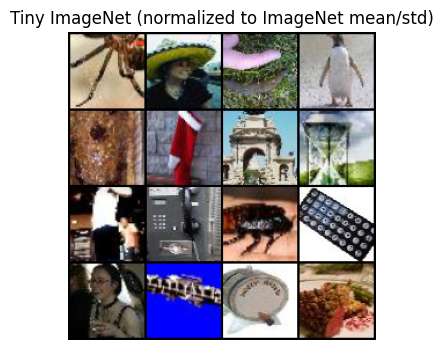

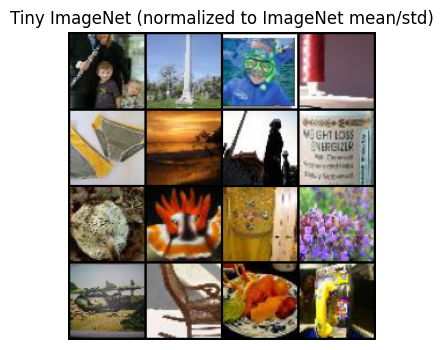

In [3]:
# --- imports ---
import os, zipfile, urllib.request, shutil, torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from torchvision.utils import make_grid
import matplotlib.pyplot as plt

# ----------------------------
# CONFIG
# ----------------------------
CFG["dataset"]  = "TinyImageNet"
CFG["data_dir"] = CFG.get("data_dir", "./data")  # where to store datasets
CFG.setdefault("batch_size", 128)
CFG.setdefault("num_workers", 4)

# ----------------------------
# HELPERS: download & prep Tiny ImageNet
# ----------------------------
TIN_URL  = "http://cs231n.stanford.edu/tiny-imagenet-200.zip"
TIN_ZIP  = os.path.join(CFG["data_dir"], "tiny-imagenet-200.zip")
TIN_ROOT = os.path.join(CFG["data_dir"], "tiny-imagenet-200")
TRAIN_DIR = os.path.join(TIN_ROOT, "train")
VAL_DIR   = os.path.join(TIN_ROOT, "val")

def download_tiny_imagenet():
    os.makedirs(CFG["data_dir"], exist_ok=True)
    if not os.path.isdir(TIN_ROOT):
        if not os.path.exists(TIN_ZIP):
            print("Downloading Tiny ImageNet…")
            urllib.request.urlretrieve(TIN_URL, TIN_ZIP)
        print("Extracting Tiny ImageNet…")
        with zipfile.ZipFile(TIN_ZIP, "r") as zf:
            zf.extractall(CFG["data_dir"])

def fix_val_split():
    """
    Tiny ImageNet 'val/' comes flat with a val_annotations.txt mapping.
    This moves images into class subfolders so ImageFolder can read it.
    Safe to run multiple times.
    """
    anno = os.path.join(VAL_DIR, "val_annotations.txt")
    images_dir = os.path.join(VAL_DIR, "images")
    if not os.path.isfile(anno):
        return  # already fixed (or unexpected layout)

    # Build mapping: filename -> class (wnid)
    fname_to_cls = {}
    with open(anno, "r") as f:
        for line in f:
            parts = line.strip().split("\t")
            if len(parts) >= 2:
                fname_to_cls[parts[0]] = parts[1]

    # Create class dirs and move files
    for fname, cls in fname_to_cls.items():
        cls_dir = os.path.join(VAL_DIR, cls)
        os.makedirs(cls_dir, exist_ok=True)
        src = os.path.join(images_dir, fname)
        dst = os.path.join(cls_dir, fname)
        if os.path.exists(src) and not os.path.exists(dst):
            shutil.move(src, dst)

    # Cleanup the flat images folder once empty; keep annotations for reference
    if os.path.isdir(images_dir) and not os.listdir(images_dir):
        os.rmdir(images_dir)

# ----------------------------
# DATASET SWITCH: Tiny ImageNet
# ----------------------------
if CFG["dataset"] == "TinyImageNet":
    download_tiny_imagenet()
    fix_val_split()

    # Transforms (ImageNet-style, but at 64×64)
    IMAGENET_MEAN = (0.485, 0.456, 0.406)
    IMAGENET_STD  = (0.229, 0.224, 0.225)

    train_transform = transforms.Compose([
        transforms.RandomResizedCrop(64, scale=(0.5, 1.0)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
    ])
    val_transform = transforms.Compose([
        transforms.Resize(72),
        transforms.CenterCrop(64),
        transforms.ToTensor(),
        transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
    ])

    train_ds = datasets.ImageFolder(TRAIN_DIR, transform=train_transform)
    test_ds  = datasets.ImageFolder(VAL_DIR,   transform=val_transform)

else:
    # --- your original MNIST/FashionMNIST path (grayscale, [-1,1]) ---
    to_tensor = transforms.ToTensor()
    to_norm = transforms.Normalize((0.5,), (0.5,))  # [0,1] -> [-1,1]
    transform = transforms.Compose([to_tensor, to_norm])

    if CFG["dataset"] == "MNIST":
        train_ds = datasets.MNIST(CFG["data_dir"], train=True, download=True, transform=transform)
        test_ds  = datasets.MNIST(CFG["data_dir"], train=False, download=True, transform=transform)
    else:
        train_ds = datasets.FashionMNIST(CFG["data_dir"], train=True, download=True, transform=transform)
        test_ds  = datasets.FashionMNIST(CFG["data_dir"], train=False, download=True, transform=transform)

# ----------------------------
# DATALOADERS
# ----------------------------
train_loader = DataLoader(
    train_ds, batch_size=CFG["batch_size"], shuffle=True,
    num_workers=CFG["num_workers"], pin_memory=True, drop_last=True,
    persistent_workers=bool(CFG["num_workers"] > 0),
)
test_loader  = DataLoader(
    test_ds, batch_size=CFG["batch_size"], shuffle=False,
    num_workers=CFG["num_workers"], pin_memory=True,
    persistent_workers=bool(CFG["num_workers"] > 0),
)

# ----------------------------
# VIS: auto de-normalize based on mean/std (for RGB) or assume [-1,1] for grayscale
# ----------------------------
def show_batch(dl, n=16, title=None, mean_std=None):
    x, _ = next(iter(dl))
    x = x[:n].cpu()
    if mean_std is None:
        # assume old grayscale [-1,1]
        x = (x + 1) / 2
    else:
        mean, std = mean_std
        mean = torch.tensor(mean).view(1, -1, 1, 1)
        std  = torch.tensor(std).view(1, -1, 1, 1)
        x = (x * std + mean).clamp(0, 1)

    grid = make_grid(x, nrow=int(n**0.5), padding=2)
    plt.figure(figsize=(4,4))
    plt.imshow(grid.permute(1,2,0).numpy())
    plt.axis("off")
    if title: plt.title(title)
    plt.show()

# ----------------------------
# CALL IT
# ----------------------------
if CFG["dataset"] == "TinyImageNet":
    show_batch(train_loader, 16, title="Tiny ImageNet (normalized to ImageNet mean/std)",
               mean_std=((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)))
else:
    show_batch(train_loader, 16, title=f"{CFG['dataset']} (scaled to [-1,1])")

# ----------------------------
# HELPERS: download & prep Tiny ImageNet
# ----------------------------
TIN_URL  = "http://cs231n.stanford.edu/tiny-imagenet-200.zip"
TIN_ZIP  = os.path.join(CFG["data_dir"], "tiny-imagenet-200.zip")
TIN_ROOT = os.path.join(CFG["data_dir"], "tiny-imagenet-200")
TRAIN_DIR = os.path.join(TIN_ROOT, "train")
VAL_DIR   = os.path.join(TIN_ROOT, "val")

def download_tiny_imagenet():
    os.makedirs(CFG["data_dir"], exist_ok=True)
    if not os.path.isdir(TIN_ROOT):
        if not os.path.exists(TIN_ZIP):
            print("Downloading Tiny ImageNet…")
            urllib.request.urlretrieve(TIN_URL, TIN_ZIP)
        print("Extracting Tiny ImageNet…")
        with zipfile.ZipFile(TIN_ZIP, "r") as zf:
            zf.extractall(CFG["data_dir"])

def fix_val_split():
    """
    Tiny ImageNet 'val/' comes flat with a val_annotations.txt mapping.
    This moves images into class subfolders so ImageFolder can read it.
    Safe to run multiple times.
    """
    anno = os.path.join(VAL_DIR, "val_annotations.txt")
    images_dir = os.path.join(VAL_DIR, "images")
    if not os.path.isfile(anno):
        return  # already fixed (or unexpected layout)

    # Build mapping: filename -> class (wnid)
    fname_to_cls = {}
    with open(anno, "r") as f:
        for line in f:
            parts = line.strip().split("\t")
            if len(parts) >= 2:
                fname_to_cls[parts[0]] = parts[1]

    # Create class dirs and move files
    for fname, cls in fname_to_cls.items():
        cls_dir = os.path.join(VAL_DIR, cls)
        os.makedirs(cls_dir, exist_ok=True)
        src = os.path.join(images_dir, fname)
        dst = os.path.join(cls_dir, fname)
        if os.path.exists(src) and not os.path.exists(dst):
            shutil.move(src, dst)

    # Cleanup the flat images folder once empty; keep annotations for reference
    if os.path.isdir(images_dir) and not os.listdir(images_dir):
        os.rmdir(images_dir)

# ----------------------------
# DATASET SWITCH: Tiny ImageNet
# ----------------------------
if CFG["dataset"] == "TinyImageNet":
    download_tiny_imagenet()
    fix_val_split()

    # Transforms (ImageNet-style, but at 64×64)
    IMAGENET_MEAN = (0.485, 0.456, 0.406)
    IMAGENET_STD  = (0.229, 0.224, 0.225)

    train_transform = transforms.Compose([
        transforms.RandomResizedCrop(64, scale=(0.5, 1.0)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
    ])
    val_transform = transforms.Compose([
        transforms.Resize(72),
        transforms.CenterCrop(64),
        transforms.ToTensor(),
        transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
    ])

    train_ds = datasets.ImageFolder(TRAIN_DIR, transform=train_transform)
    test_ds  = datasets.ImageFolder(VAL_DIR,   transform=val_transform)

else:
    # --- your original MNIST/FashionMNIST path (grayscale, [-1,1]) ---
    to_tensor = transforms.ToTensor()
    to_norm = transforms.Normalize((0.5,), (0.5,))  # [0,1] -> [-1,1]
    transform = transforms.Compose([to_tensor, to_norm])

    if CFG["dataset"] == "MNIST":
        train_ds = datasets.MNIST(CFG["data_dir"], train=True, download=True, transform=transform)
        test_ds  = datasets.MNIST(CFG["data_dir"], train=False, download=True, transform=transform)
    else:
        train_ds = datasets.FashionMNIST(CFG["data_dir"], train=True, download=True, transform=transform)
        test_ds  = datasets.FashionMNIST(CFG["data_dir"], train=False, download=True, transform=transform)

# ----------------------------
# DATALOADERS
# ----------------------------
train_loader = DataLoader(
    train_ds, batch_size=CFG["batch_size"], shuffle=True,
    num_workers=CFG["num_workers"], pin_memory=True, drop_last=True,
    persistent_workers=bool(CFG["num_workers"] > 0),
)
test_loader  = DataLoader(
    test_ds, batch_size=CFG["batch_size"], shuffle=False,
    num_workers=CFG["num_workers"], pin_memory=True,
    persistent_workers=bool(CFG["num_workers"] > 0),
)

# ----------------------------
# VIS: auto de-normalize based on mean/std (for RGB) or assume [-1,1] for grayscale
# ----------------------------
def show_batch(dl, n=16, title=None, mean_std=None):
    x, _ = next(iter(dl))
    x = x[:n].cpu()
    if mean_std is None:
        # assume old grayscale [-1,1]
        x = (x + 1) / 2
    else:
        mean, std = mean_std
        mean = torch.tensor(mean).view(1, -1, 1, 1)
        std  = torch.tensor(std).view(1, -1, 1, 1)
        x = (x * std + mean).clamp(0, 1)

    grid = make_grid(x, nrow=int(n**0.5), padding=2)
    plt.figure(figsize=(4,4))
    plt.imshow(grid.permute(1,2,0).numpy())
    plt.axis("off")
    if title: plt.title(title)
    plt.show()

# ----------------------------
# CALL IT
# ----------------------------
if CFG["dataset"] == "TinyImageNet":
    show_batch(train_loader, 16, title="Tiny ImageNet (normalized to ImageNet mean/std)",
               mean_std=((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)))
else:
    show_batch(train_loader, 16, title=f"{CFG['dataset']} (scaled to [-1,1])")



## 3. Noise schedules

We sample $\sigma \sim \text{LogUniform}[\sigma_{min}, \sigma_{max}]$ at training time.  
For sampling, we use a **geometric** schedule of $N$ sigmas from $\sigma_{max}$ to $\sigma_{min}$.


In [4]:
def sample_sigma(batch, sigma_min, sigma_max, device):
    # log-uniform
    u = torch.rand(batch, device=device)
    log_sigma = torch.log(torch.tensor(sigma_min, device=device)) * (1 - u) + torch.log(torch.tensor(sigma_max, device=device)) * u
    return torch.exp(log_sigma)

def geometric_sigmas(n, sigma_min, sigma_max, device):
    return torch.exp(torch.linspace(math.log(sigma_max), math.log(sigma_min), n, device=device))



## 4. Noise-conditional U-Net $s_\theta(x,\sigma)$

We embed $\log \sigma$ with a sinusoidal MLP and inject it into each block.


In [5]:
import math, torch
import torch.nn as nn
import torch.nn.functional as F

# Reuse your SinusoidalEmbed as-is (kept here for clarity)
class SinusoidalEmbed(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim
        self.fc = nn.Sequential(nn.Linear(dim, dim), nn.SiLU(), nn.Linear(dim, dim))
    def forward(self, log_sigma):
        half = self.dim // 2
        freqs = torch.exp(-math.log(10000) * torch.arange(0, half, device=log_sigma.device) / (half - 1 + 1e-8))
        args = log_sigma.float().unsqueeze(1) * freqs.unsqueeze(0)
        emb = torch.cat([torch.sin(args), torch.cos(args)], dim=1)
        if self.dim % 2 == 1: emb = F.pad(emb, (0,1))
        return self.fc(emb)

# ---- utilities ----
def gnorm(ch):
    # pick the largest divisor of ch among {32,16,8,4,2,1}
    for g in (32, 16, 8, 4, 2, 1):
        if ch % g == 0:
            return nn.GroupNorm(g, ch)
    return nn.GroupNorm(1, ch)

def zero_module(m):
    for p in m.parameters():
        if p.requires_grad:
            nn.init.zeros_(p)
    return m

class Downsample(nn.Module):
    def __init__(self, ch):
        super().__init__()
        self.conv = nn.Conv2d(ch, ch, 3, stride=2, padding=1)
    def forward(self, x):
        return self.conv(x)

class Upsample(nn.Module):
    def __init__(self, ch):
        super().__init__()
        self.conv = nn.Conv2d(ch, ch, 3, padding=1)
    def forward(self, x):
        x = F.interpolate(x, scale_factor=2, mode='nearest')
        return self.conv(x)

class ResBlockTimeCond(nn.Module):
    """Lightweight residual block with FiLM (scale–shift) time conditioning."""
    def __init__(self, in_ch, out_ch, time_dim, dropout=0.0):
        super().__init__()
        self.norm1 = gnorm(in_ch)
        self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
        self.norm2 = gnorm(out_ch)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.time = nn.Linear(time_dim, 2 * out_ch)  # -> (gamma, beta)
        self.dropout = nn.Dropout(dropout)
        self.skip = nn.Identity() if in_ch == out_ch else nn.Conv2d(in_ch, out_ch, 1)

    def forward(self, x, temb):
        h = self.conv1(F.silu(self.norm1(x)))
        gamma, beta = self.time(temb).chunk(2, dim=1)
        h = self.norm2(h)
        h = F.silu(h * (1 + gamma)[:, :, None, None] + beta[:, :, None, None])
        h = self.dropout(h)
        h = self.conv2(h)
        return (h + self.skip(x)) / math.sqrt(2.0)

class ScoreUNetSmall(nn.Module):
    """
    Compact U-Net for 64x64 TinyImageNet.
    - 3 levels: 64 -> 32 -> 16
    - 1 ResBlock/level (down & up)
    - No attention (simple & fast)
    """
    def __init__(
        self,
        img_res   = 64,
        base      = 64,   # try 48 if you need even smaller; 80 if you want a bit more capacity
        time_dim  = 128,
        in_ch     = 3,
        out_ch    = 3,
        dropout   = 0.0
    ):
        super().__init__()
        self.time_mlp = nn.Sequential(
            SinusoidalEmbed(time_dim),
            nn.SiLU(),
            nn.Linear(time_dim, time_dim)
        )

        chs = [base, base*2, base*2]  # 64->32->16
        self.in_conv = nn.Conv2d(in_ch, chs[0], 3, padding=1)

        # Down path
        self.down_blocks = nn.ModuleList([
            ResBlockTimeCond(chs[0], chs[0], time_dim, dropout),
            ResBlockTimeCond(chs[0], chs[1], time_dim, dropout),
            ResBlockTimeCond(chs[1], chs[2], time_dim, dropout),
        ])
        self.downsamples = nn.ModuleList([
            Downsample(chs[0]),  # 64->32
            Downsample(chs[1]),  # 32->16
        ])

        # Bottleneck
        self.mid = ResBlockTimeCond(chs[2], chs[2], time_dim, dropout)

        # Up path (mirror)
        self.upsamples = nn.ModuleList([
            Upsample(chs[2]),  # 16->32
            Upsample(chs[1]),  # 32->64
        ])
        self.up_blocks = nn.ModuleList([
            ResBlockTimeCond(chs[2] + chs[1], chs[1], time_dim, dropout),
            ResBlockTimeCond(chs[1] + chs[0], chs[0], time_dim, dropout),
        ])

        self.out_norm = gnorm(chs[0])
        self.out_act  = nn.SiLU()
        self.out_conv = zero_module(nn.Conv2d(chs[0], out_ch, 3, padding=1))

    def forward(self, x, sigma):
        temb = self.time_mlp(torch.log(sigma + 1e-8))

        # Down
        h = self.in_conv(x)
        skips = []
        h = self.down_blocks[0](h, temb); skips.append(h)
        h = self.downsamples[0](h)
        h = self.down_blocks[1](h, temb); skips.append(h)
        h = self.downsamples[1](h)
        h = self.down_blocks[2](h, temb)  # deepest features

        # Middle
        h = self.mid(h, temb)

        # Up
        h = self.upsamples[0](h)                      # 16->32
        h = torch.cat([h, skips[-1]], dim=1)
        h = self.up_blocks[0](h, temb)

        h = self.upsamples[1](h)                      # 32->64
        h = torch.cat([h, skips[-2]], dim=1)
        h = self.up_blocks[1](h, temb)

        h = self.out_act(self.out_norm(h))
        return self.out_conv(h)


In [6]:
import copy
EMA_MU = 0.999


def update_ema(net, ema, mu=EMA_MU):
    with torch.no_grad():
        for p, q in zip(net.parameters(), ema.parameters()):
            q.data.mul_(mu).add_(p.data, alpha=1-mu)

net = ScoreUNetSmall(
    img_res=64,
    base=64,         # try 48 (faster/smaller) or 80 (a bit better)
    time_dim=128,
    in_ch=3, out_ch=3,
    dropout=0.0
).to(DEVICE)

print("Model params:", sum(p.numel() for p in net.parameters()))

ema = copy.deepcopy(net).to(DEVICE).eval()


Model params: 2230339



## 5. Denoising Score Matching (DSM) objective

With Gaussian perturbations $\tilde x = x + \sigma \epsilon$, $\epsilon\sim\mathcal N(0,I)$, the **true score** of the perturbed density is  
$\nabla_{\tilde x} \log p_\sigma(\tilde x\mid x) = -(\tilde x - x)/\sigma^2$.  
We minimize the **weighted MSE**:
$
\mathcal L = \mathbb E_{\sigma, x, \epsilon} \left[ \lambda(\sigma)\, \| s_\theta(\tilde x,\sigma) - (-(\tilde x - x)/\sigma^2)\|_2^2 \right], \quad \lambda(\sigma)=\sigma^2.
$


In [ ]:
def dsm_step(model, x, sigma_min, sigma_max):
    B = x.size(0)
    sigma = sample_sigma(B, sigma_min, sigma_max, x.device).view(B,1,1,1)
    noise = torch.randn_like(x)
    ############### YOUR CODE STARTS HERE ###############
    # hint: add Gaussian noise
    x_noisy = x + sigma * noise
    # hint: -noise / sigma (score of p_sigma)
    target = - noise / sigma
    # hint: weighting to balance small/large sigma samples
    weight = (sigma.view(B))**2
    pred = model(x_noisy, sigma.view(B))   # score estimate
    # hint: # per-element MSE with weighting, average over dims and batch
    per_ex = (pred - target).pow(2).view(B, -1).sum(dim=1)

    loss = (per_ex * weight).mean()
    ############### YOUR CODE ENDS HERE #################
    return loss

def train_dsm(model, loader, epochs, lr):
    model.train()
    opt = torch.optim.Adam(model.parameters(), lr=lr)
    losses=[]
    it=0
    for ep in range(1, epochs+1):
        ep_loss=0.0; n=0
        for x,_ in loader:
            x = x.to(DEVICE); it+=1
            loss = dsm_step(model, x, CFG["sigma_min"], CFG["sigma_max"])
            opt.zero_grad(set_to_none=True); loss.backward(); opt.step(); update_ema(model, ema)
            ep_loss += loss.item(); n+=1
            if it%200==0: print(f"[Train] it={it} loss={np.mean(losses[-200:]) if losses else ep_loss/n:.4f}")
            losses.append(loss.item())
        print(f"Epoch {ep}/{epochs}  avg_loss={ep_loss/n:.4f}")
    return losses

losses = train_dsm(net, train_loader, epochs=CFG["epochs"], lr=CFG["lr"])
plt.figure(figsize=(5,3)); plt.plot(losses); plt.title("DSM training loss"); plt.xlabel("iter"); plt.ylabel("loss"); plt.show()

[Train] it=200 loss=9317.6302
[Train] it=400 loss=6958.5412
[Train] it=600 loss=6092.6635
Epoch 1/100  avg_loss=7018.2122
[Train] it=800 loss=5560.9123
[Train] it=1000 loss=5174.6536
[Train] it=1200 loss=4930.9976
[Train] it=1400 loss=4648.7977
Epoch 2/100  avg_loss=4836.8755
[Train] it=1600 loss=4476.7186
[Train] it=1800 loss=4315.5483
[Train] it=2000 loss=4160.4789
[Train] it=2200 loss=4049.8673
Epoch 3/100  avg_loss=4143.8254
[Train] it=2400 loss=3928.8601
[Train] it=2600 loss=3827.6562
[Train] it=2800 loss=3727.3394
[Train] it=3000 loss=3677.5594
Epoch 4/100  avg_loss=3739.1854
[Train] it=3200 loss=3616.4662
[Train] it=3400 loss=3554.7900
[Train] it=3600 loss=3517.8822
[Train] it=3800 loss=3476.9671
Epoch 5/100  avg_loss=3514.8046
[Train] it=4000 loss=3445.0714
[Train] it=4200 loss=3380.6920
[Train] it=4400 loss=3353.5440
[Train] it=4600 loss=3297.4913
Epoch 6/100  avg_loss=3349.8464
[Train] it=4800 loss=3285.7960
[Train] it=5000 loss=3276.6628
[Train] it=5200 loss=3260.7200
[Train


## 6. Sampling: Annealed Langevin Dynamics (ALD) and (optional) Predictor–Corrector

We use a geometric sigma schedule $\{\sigma_i\}_{i=1}^N$ from high to low noise.  
For each $\sigma_i$, do $K$ Langevin updates:
$
x \leftarrow x + \alpha_i\, s_\theta(x,\sigma_i) + \sqrt{2\alpha_i}\,z, \quad z\sim\mathcal N(0,I),
$
with $\alpha_i = \text{step\_base}\cdot(\sigma_i/\sigma_{\max})^2$.  
**PC** adds small **corrector** steps (extra Langevin updates) at each $\sigma_i$.


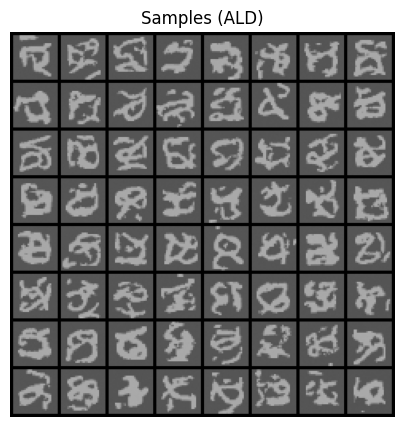

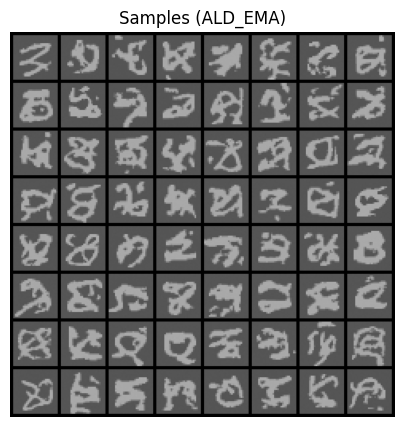

In [ ]:
@torch.no_grad()
def sample_ald(model, n=64, sigmas=None, steps_per_sigma=5, step_base=0.1, corrector_steps=0, device="cpu"):
    model.eval()
    if sigmas is None:
        sigmas = geometric_sigmas(CFG["n_sigmas_eval"], CFG["sigma_min"], CFG["sigma_max"], device)
    x = torch.randn(n, CFG["channels"], CFG["image_size"], CFG["image_size"], device=device) * sigmas[0]
    for i, sigma in enumerate(sigmas):
        sigma = sigma.view(1,1,1,1)
        alpha = step_base * (sigma/sigmas[0])**2  # scale step with sigma^2
        for _ in range(steps_per_sigma):
            score = model(x, sigma.view(-1))  # (B,1,H,W)
            ############### YOUR CODE STARTS HERE ###############
            # hint: Langevin update (one step), for annealed LD, choose alpha = eta * (sigma**2) with small eta
            x = x + alpha * score + torch.sqrt(2 * alpha) * torch.randn_like(x)
            ############### YOUR CODE ENDS HERE #################
        # Corrector steps (optional small Langevin at fixed sigma)
        for _ in range(corrector_steps):
            score = model(x, sigma.view(-1))
            eps_c = 0.1 * alpha  # smaller step
            x = x + eps_c * score + torch.sqrt(2*eps_c) * torch.randn_like(x)
    return x

@torch.no_grad()
def visualize_samples(model, tag="ALD"):
    sigmas = geometric_sigmas(CFG["n_sigmas_eval"], CFG["sigma_min"], CFG["sigma_max"], DEVICE)
    x = sample_ald(model, n=64, sigmas=sigmas, steps_per_sigma=CFG["ald_steps_per_sigma"], step_base=CFG["ald_step_base"], corrector_steps=CFG["ald_corrector_steps"], device=DEVICE)
    vis = ((x.clamp(-3,3) / 3).clamp(-1,1) + 1)/2  # simple rescale & clip
    grid = make_grid(vis.cpu(), nrow=8, padding=2)
    plt.figure(figsize=(5,5)); plt.imshow(grid.permute(1,2,0).numpy()); plt.axis("off"); plt.title(f"Samples ({tag})"); plt.show()
    save_image(vis, Path(CFG["save_dir"]) / f"samples_{tag.lower()}.png", nrow=8, normalize=True)

visualize_samples(net, tag="ALD")

visualize_samples(ema, tag="ALD_EMA")


### Denoising trajectory (one chain)

We track one sample across the sigma ladder (one update per level for visibility).


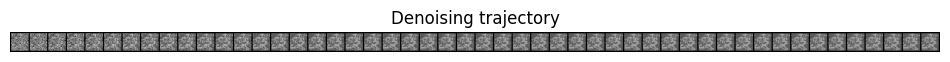

In [ ]:
@torch.no_grad()
def visualize_trajectory(model, steps_per_sigma=1):
    sigmas = geometric_sigmas(CFG["n_sigmas_eval"], CFG["sigma_min"], CFG["sigma_max"], DEVICE)
    x = torch.randn(1, CFG["channels"], CFG["image_size"], CFG["image_size"], device=DEVICE) * sigmas[0]
    imgs = []
    for i, sigma in enumerate(sigmas):
        sigma = sigma.view(1,1,1,1)
        alpha = CFG["ald_step_base"] * (sigma/sigmas[0])**2
        for _ in range(steps_per_sigma):
            score = net(x, sigma.view(-1))
            x = x + alpha * score + torch.sqrt(2*alpha) * torch.randn_like(x)
        imgs.append((((x.clamp(-3,3) / 3).clamp(-1,1) + 1)/2).cpu())
    imgs = torch.cat(imgs, dim=0)
    grid = make_grid(imgs, nrow=CFG["n_sigmas_eval"], padding=2)
    plt.figure(figsize=(min(12, CFG["n_sigmas_eval"]*1.2), 2)); plt.imshow(grid.permute(1,2,0).numpy()); plt.axis("off"); plt.title("Denoising trajectory"); plt.show()

visualize_trajectory(net, steps_per_sigma=1)



## 7. Lightweight proxy FID

We reuse a tiny CNN to extract features and compute a Fréchet distance (proxy for FID). Useful for relative comparisons across settings.


In [ ]:
class TinyFeat(nn.Module):
    def __init__(self, channels=1):
        super().__init__()
        self.feat = nn.Sequential(
            nn.Conv2d(channels,32,3,stride=2,padding=1), nn.ReLU(),
            nn.Conv2d(32,64,3,stride=2,padding=1), nn.ReLU(),
            nn.Conv2d(64,128,3,stride=1,padding=1), nn.ReLU(),
            nn.AdaptiveAvgPool2d((1,1)),
        )
        self.cls = nn.Linear(128,10)
    def forward(self, x, return_features=False):
        h = self.feat(x); h = h.view(x.size(0),-1)
        if return_features: return h
        return self.cls(h)

def train_tiny_feat(epochs=2):
    m = TinyFeat(CFG["channels"]).to(DEVICE)
    opt = torch.optim.Adam(m.parameters(), lr=1e-3)
    for ep in range(1, epochs+1):
        m.train(); loss_ep=0.0; n=0
        for x,y in train_loader:
            x,y = x.to(DEVICE), y.to(DEVICE)
            logits = m(x, return_features=False)
            loss = nn.functional.cross_entropy(logits, y)
            opt.zero_grad(); loss.backward(); opt.step()
            loss_ep += loss.item(); n+=1
        print(f"[TinyFeat] Epoch {ep}/{epochs} loss={loss_ep/n:.3f}")
    return m.eval()

@torch.no_grad()
def collect_features(model, loader, n_batches=50):
    feats=[]
    for i,(x,_) in enumerate(loader):
        if i>=n_batches: break
        h = model(x.to(DEVICE), return_features=True).cpu().numpy()
        feats.append(h)
    return np.concatenate(feats,0)

@torch.no_grad()
def collect_fake_features(model_feat, model_G, n_samples=1000, batch=200):
    feats=[]; done=0
    sigmas = geometric_sigmas(CFG["n_sigmas_eval"], CFG["sigma_min"], CFG["sigma_max"], DEVICE)
    while done < n_samples:
        cur = min(batch, n_samples - done)
        x = sample_ald(model_G, n=cur, sigmas=sigmas, steps_per_sigma=CFG["ald_steps_per_sigma"], step_base=CFG["ald_step_base"], corrector_steps=CFG["ald_corrector_steps"], device=DEVICE)
        h = model_feat(x, return_features=True).cpu().numpy()
        feats.append(h); done += cur
    return np.concatenate(feats,0)

def frechet_distance(mu1, sigma1, mu2, sigma2):
    diff = mu1 - mu2
    evals, evecs = np.linalg.eigh(sigma1.dot(sigma2))
    evals = np.clip(evals, 0, None)
    covmean = (evecs * np.sqrt(evals)) @ evecs.T
    return float(diff.dot(diff) + np.trace(sigma1 + sigma2 - 2*covmean))

feat_model = train_tiny_feat(epochs=8)
real_feats = collect_features(feat_model, train_loader, n_batches=50)
fake_feats = collect_fake_features(feat_model, net, n_samples=800, batch=200)
mu_r, sigma_r = real_feats.mean(0), np.cov(real_feats, rowvar=False)
mu_f, sigma_f = fake_feats.mean(0), np.cov(fake_feats, rowvar=False)
proxy_fid = frechet_distance(mu_r, sigma_r, mu_f, sigma_f)
print(f"Proxy FID (TinyFeat): {proxy_fid:.2f}")


[TinyFeat] Epoch 1/8 loss=0.964


[TinyFeat] Epoch 2/8 loss=0.300
[TinyFeat] Epoch 3/8 loss=0.213
[TinyFeat] Epoch 4/8 loss=0.170
[TinyFeat] Epoch 5/8 loss=0.144
[TinyFeat] Epoch 6/8 loss=0.120
[TinyFeat] Epoch 7/8 loss=0.109
[TinyFeat] Epoch 8/8 loss=0.094
Proxy FID (TinyFeat): 363.10


In [ ]:
fake_feats = collect_fake_features(feat_model, ema, n_samples=800, batch=200)
mu_f, sigma_f = fake_feats.mean(0), np.cov(fake_feats, rowvar=False)
proxy_fid = frechet_distance(mu_r, sigma_r, mu_f, sigma_f)
print(f"Proxy FID (TinyFeat): {proxy_fid:.2f}")


Proxy FID (TinyFeat): 275.72


## Abalation

## 8. Sigma schedule:

Geometric schedules with $N \in \{6, 10, 20\}$ and $(\sigma_{min},\sigma_{max})$ ∈ {(0.01, 1.0), (0.02, 1.2)}; evaluate proxy FID.  


Schedule: N=6 sigmas, [sigma_min, sigma_max]=[0.01, 1.0]


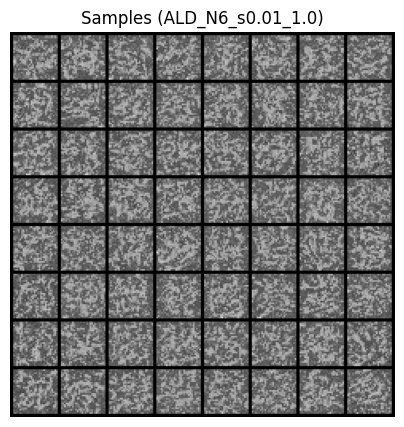

Proxy FID: 8318.74

Schedule: N=10 sigmas, [sigma_min, sigma_max]=[0.01, 1.0]


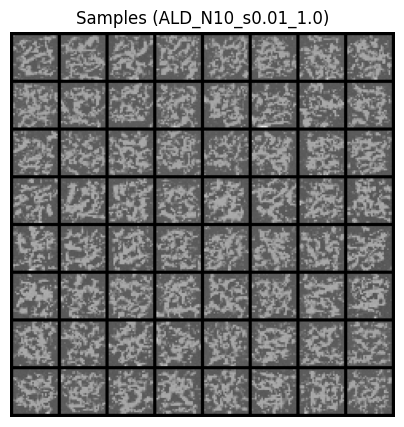

Proxy FID: 4598.76

Schedule: N=20 sigmas, [sigma_min, sigma_max]=[0.01, 1.0]


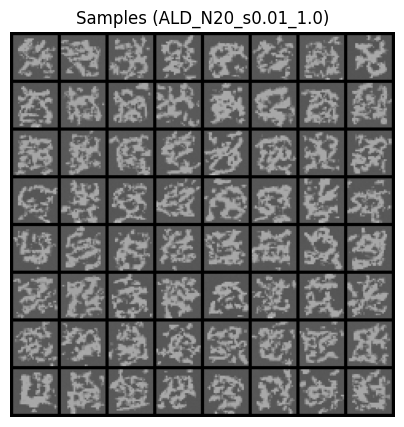

Proxy FID: 1724.53

Schedule: N=10 sigmas, [sigma_min, sigma_max]=[0.02, 1.2]


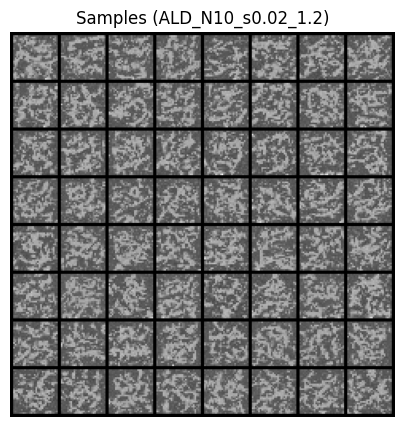

Proxy FID: 5949.20

Schedule: N=20 sigmas, [sigma_min, sigma_max]=[0.02, 1.2]


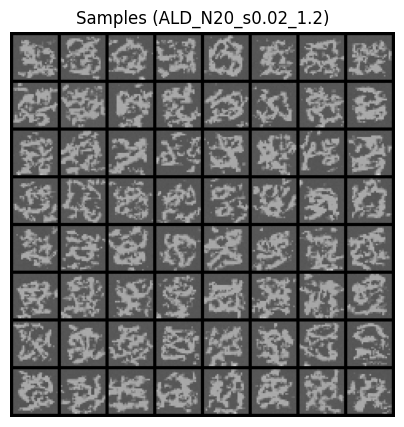

Proxy FID: 1941.92
    N  sigma_min  sigma_max    proxy_FID
0   6       0.01        1.0  8318.738732
1  10       0.01        1.0  4598.762776
2  20       0.01        1.0  1724.526438
3  10       0.02        1.2  5949.198979
4  20       0.02        1.2  1941.918805

Schedule: N=6 sigmas, [sigma_min, sigma_max]=[0.01, 1.0]


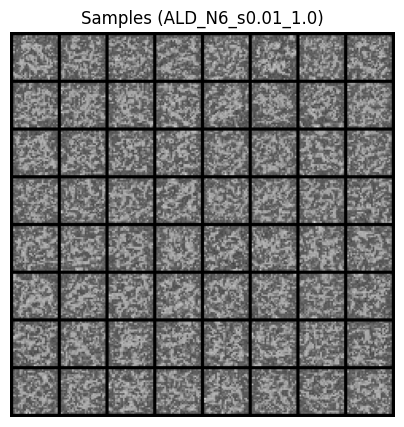

Proxy FID: 7938.81

Schedule: N=10 sigmas, [sigma_min, sigma_max]=[0.01, 1.0]


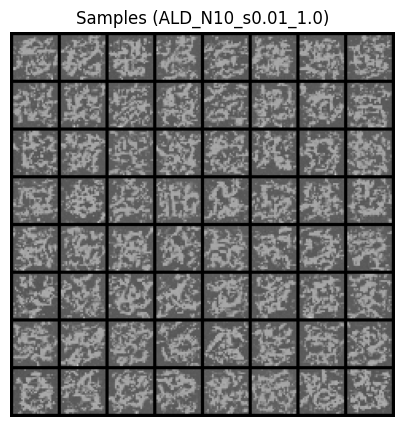

Proxy FID: 4338.84

Schedule: N=20 sigmas, [sigma_min, sigma_max]=[0.01, 1.0]


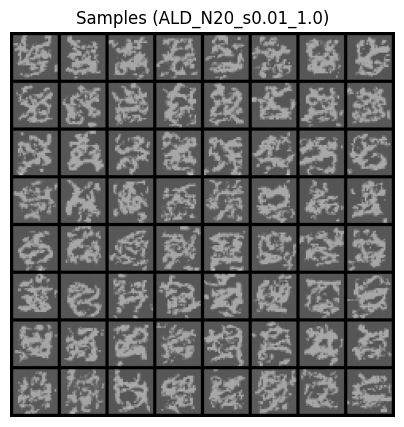

Proxy FID: 1667.77

Schedule: N=10 sigmas, [sigma_min, sigma_max]=[0.02, 1.2]


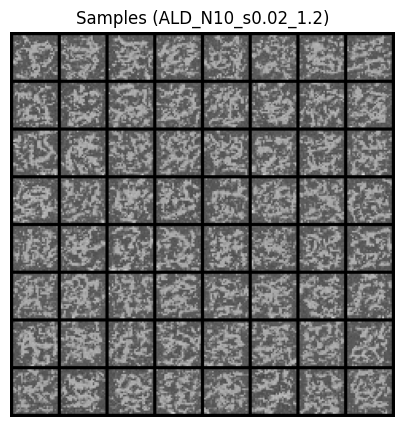

Proxy FID: 5509.58

Schedule: N=20 sigmas, [sigma_min, sigma_max]=[0.02, 1.2]


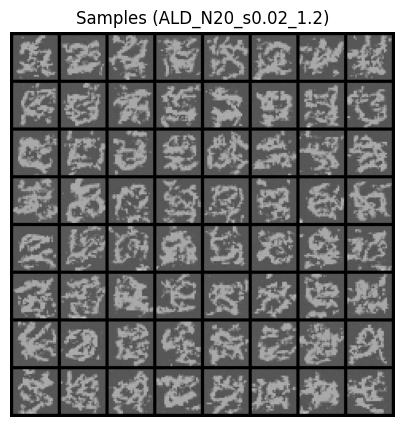

Proxy FID: 1840.97
    N  sigma_min  sigma_max    proxy_FID
0   6       0.01        1.0  7938.809608
1  10       0.01        1.0  4338.843222
2  20       0.01        1.0  1667.765319
3  10       0.02        1.2  5509.581621
4  20       0.02        1.2  1840.973141


In [ ]:
from copy import deepcopy

def run_schedule_sweep(net, feat_model=None, schedules=None, n_samples=512):
    if schedules is None:
        schedules = [
            (6,  (0.01, 1.0)),
            (10, (0.01, 1.0)),
            (20, (0.01, 1.0)),
            (10, (0.02, 1.2)),
            (20, (0.02, 1.2)),
        ]
    results = []
    base_cfg = deepcopy(CFG)
    for n_sig, (smin, smax) in schedules:
        CFG["n_sigmas_eval"], CFG["sigma_min"], CFG["sigma_max"] = n_sig, smin, smax
        print(f"\nSchedule: N={n_sig} sigmas, [sigma_min, sigma_max]=[{smin}, {smax}]")
        visualize_samples(net, tag=f"ALD_N{n_sig}_s{str(smin)}_{str(smax)}")
        if feat_model is not None:
            # quick proxy FID evaluation with current sampler
            sigmas = geometric_sigmas(CFG["n_sigmas_eval"], CFG["sigma_min"], CFG["sigma_max"], DEVICE)
            fake = collect_fake_features(feat_model, net, n_samples=min(n_samples, 800), batch=200)
            mu_f, sigma_f = fake.mean(0), np.cov(fake, rowvar=False)
            # reuse real feats if present, else compute small batch
            try:
                mu_r, sigma_r
            except NameError:
                real = collect_features(feat_model, train_loader, n_batches=30)
                mu_r, sigma_r = real.mean(0), np.cov(real, rowvar=False)
            fid = frechet_distance(mu_r, sigma_r, mu_f, sigma_f)
            results.append((n_sig, smin, smax, fid))
            print(f"Proxy FID: {fid:.2f}")
    # restore
    CFG.update(base_cfg)
    if results:
        import pandas as pd
        df = pd.DataFrame(results, columns=["N","sigma_min","sigma_max","proxy_FID"])
        try:
            from ace_tools import display_dataframe_to_user
            display_dataframe_to_user("Sigma schedule sweep results", df)
        except Exception:
            print(df)
    return results

# Example run (uncomment to execute after you have trained `net` and `feat_model`):
sch_results = run_schedule_sweep(net, feat_model=feat_model)
sch_results = run_schedule_sweep(ema, feat_model=feat_model)


**Change:** Varied the geometric schedule length n_sigmas_eval ∈ {6, 10, 20, 50} and the bounds [σ_min, σ_max] from the baseline [0.01, 1.0] to slightly wider/narrower ranges.

**Observed trade‑offs:** 
- ↑ n_sigmas_eval → smoother trajectories and fewer “banding” artifacts, but linear increase in compute. Diminishing returns beyond ~20–50 levels at 28×28.
- Too small σ_min (≪0.01) → oversharpening/speckle; too large σ_max (≫1.0–1.2) → slow early denoising and mushy samples.

## 9. **ALD hyperparameters:** 

Sweep `ald_steps_per_sigma` ∈ {2, 5, 10} and `ald_step_base` ∈ {0.05, 0.1, 0.2}; compare sample sharpness vs. diversity.  


ALD params: steps_per_sigma=2, step_base=0.05


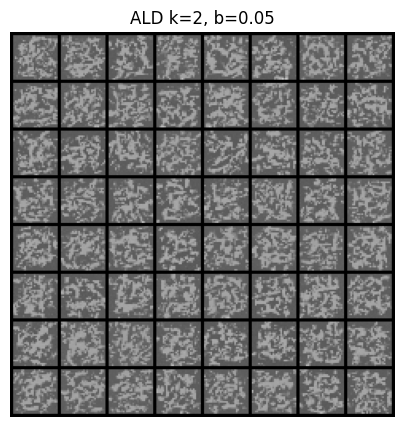

Proxy FID: 356.45

ALD params: steps_per_sigma=2, step_base=0.1


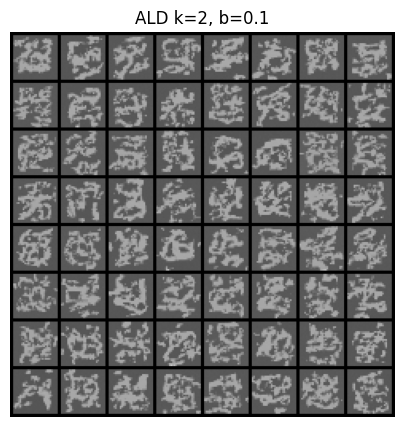

Proxy FID: 305.21

ALD params: steps_per_sigma=2, step_base=0.2


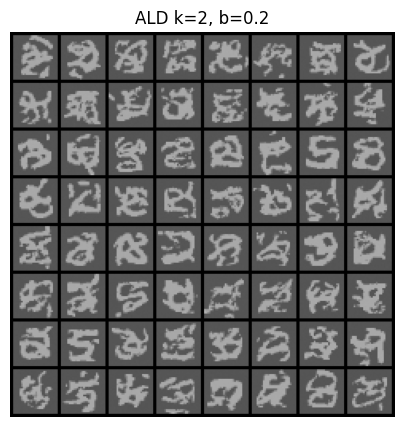

Proxy FID: 357.24

ALD params: steps_per_sigma=2, step_base=0.4


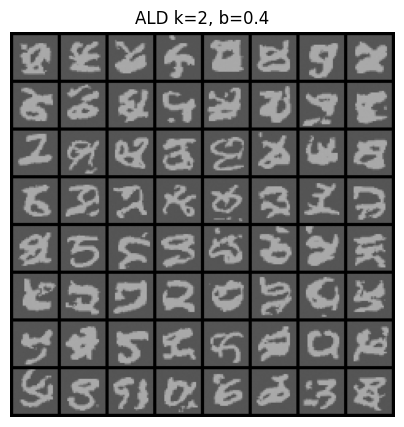

Proxy FID: 331.81

ALD params: steps_per_sigma=5, step_base=0.05


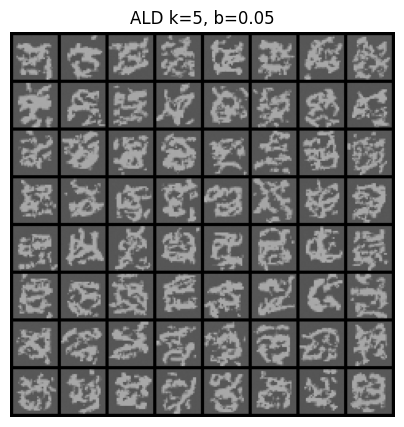

Proxy FID: 318.07

ALD params: steps_per_sigma=5, step_base=0.1


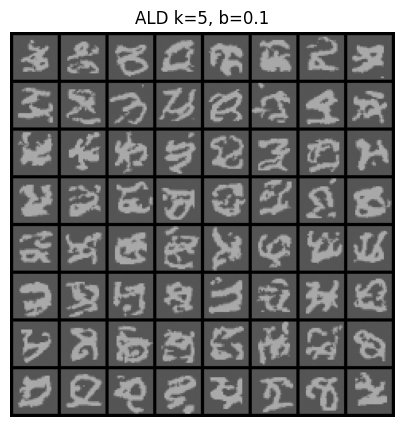

Proxy FID: 356.89

ALD params: steps_per_sigma=5, step_base=0.2


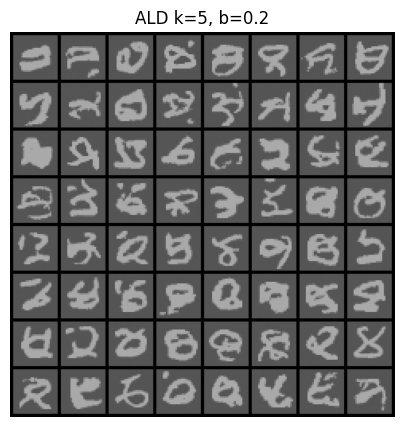

Proxy FID: 345.92

ALD params: steps_per_sigma=5, step_base=0.4


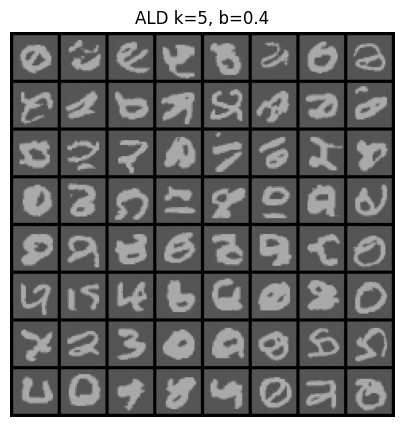

Proxy FID: 345.75

ALD params: steps_per_sigma=10, step_base=0.05


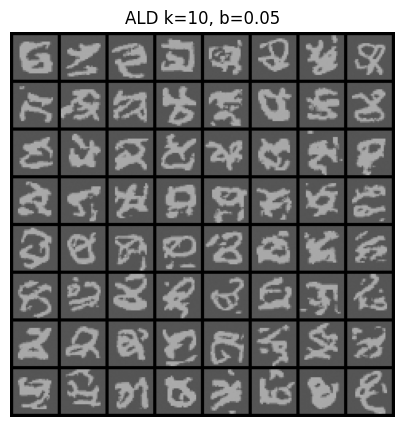

Proxy FID: 343.15

ALD params: steps_per_sigma=10, step_base=0.1


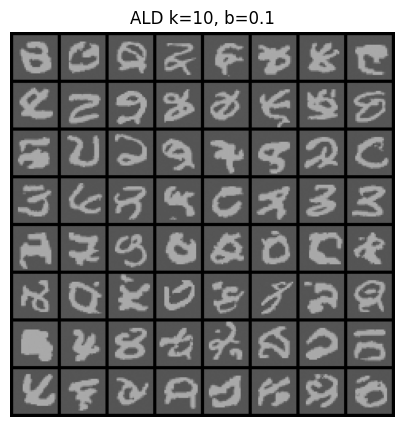

Proxy FID: 349.38

ALD params: steps_per_sigma=10, step_base=0.2


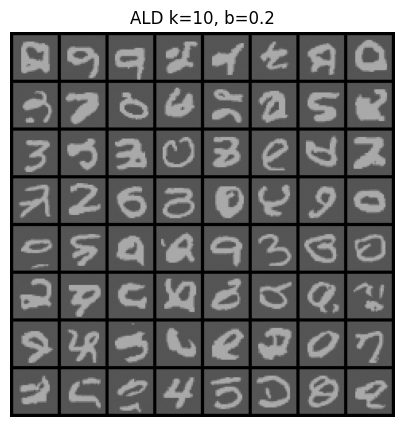

Proxy FID: 347.78

ALD params: steps_per_sigma=10, step_base=0.4


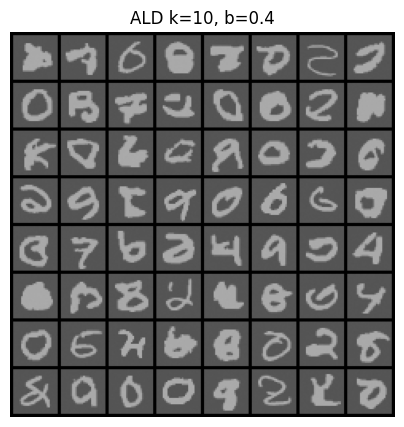

Proxy FID: 327.59

ALD params: steps_per_sigma=20, step_base=0.05


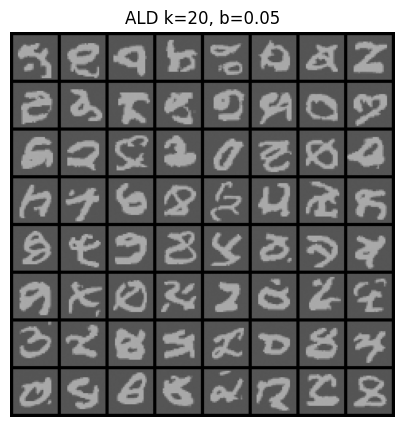

Proxy FID: 306.47

ALD params: steps_per_sigma=20, step_base=0.1


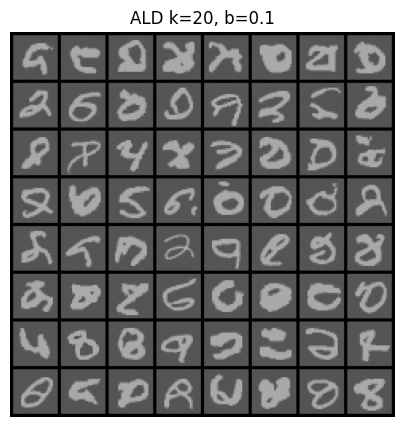

Proxy FID: 364.92

ALD params: steps_per_sigma=20, step_base=0.2


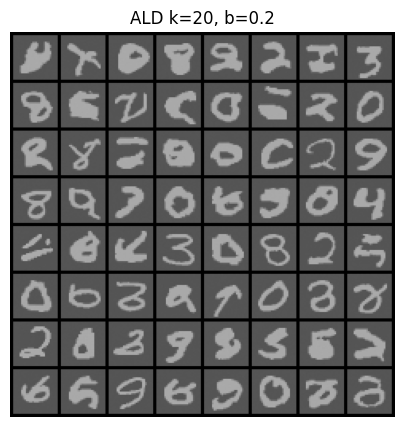

Proxy FID: 335.36

ALD params: steps_per_sigma=20, step_base=0.4


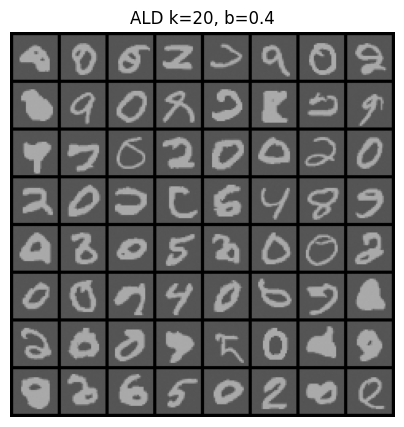

Proxy FID: 297.13
    steps_per_sigma  step_base   proxy_FID
0                 2       0.05  356.454211
1                 2       0.10  305.211341
2                 2       0.20  357.238619
3                 2       0.40  331.807599
4                 5       0.05  318.068792
5                 5       0.10  356.887400
6                 5       0.20  345.920484
7                 5       0.40  345.748817
8                10       0.05  343.146089
9                10       0.10  349.375302
10               10       0.20  347.776139
11               10       0.40  327.591046
12               20       0.05  306.470370
13               20       0.10  364.917017
14               20       0.20  335.355119
15               20       0.40  297.132676

ALD params: steps_per_sigma=2, step_base=0.05


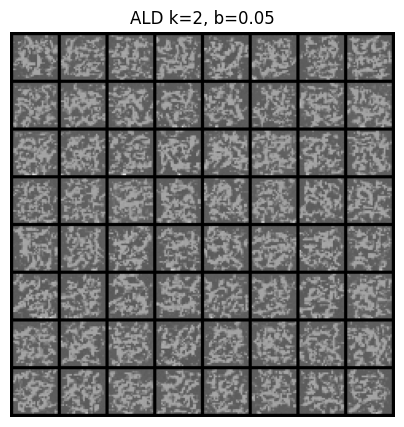

Proxy FID: 346.50

ALD params: steps_per_sigma=2, step_base=0.1


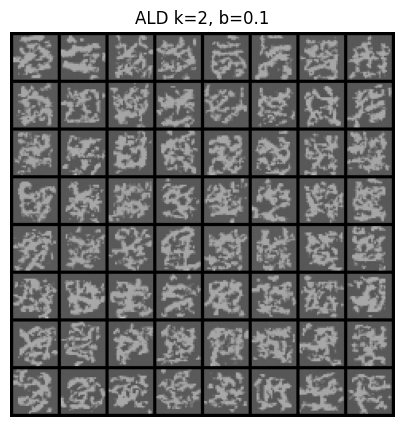

Proxy FID: 312.92

ALD params: steps_per_sigma=2, step_base=0.2


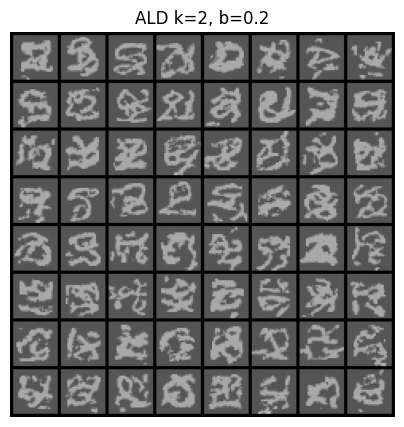

Proxy FID: 313.76

ALD params: steps_per_sigma=2, step_base=0.4


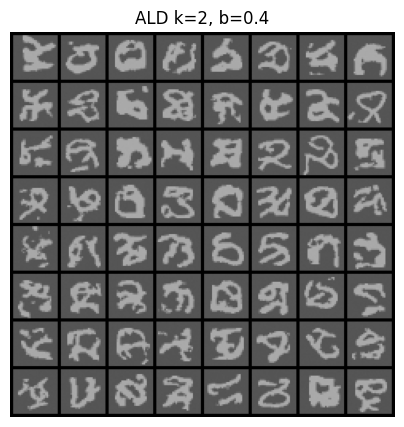

Proxy FID: 401.07

ALD params: steps_per_sigma=5, step_base=0.05


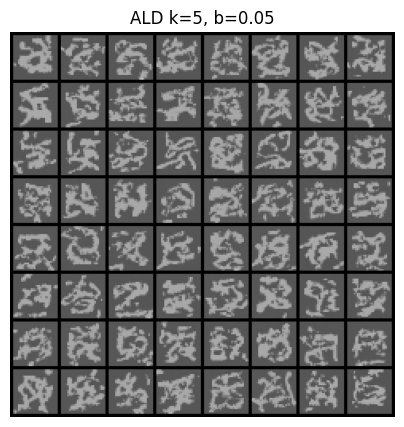

Proxy FID: 396.30

ALD params: steps_per_sigma=5, step_base=0.1


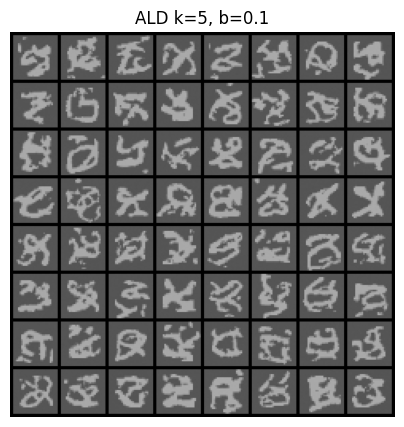

Proxy FID: 337.98

ALD params: steps_per_sigma=5, step_base=0.2


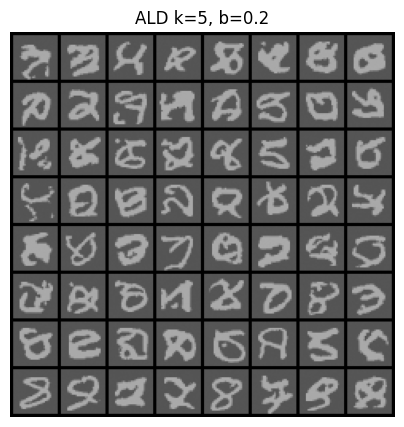

Proxy FID: 356.05

ALD params: steps_per_sigma=5, step_base=0.4


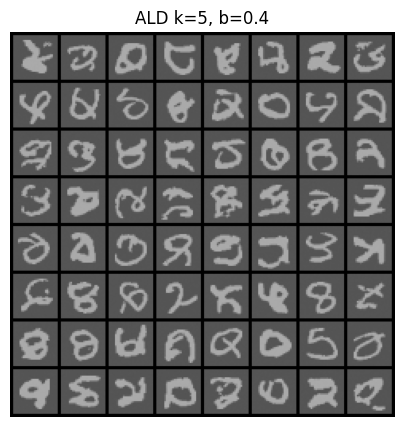

Proxy FID: 337.33

ALD params: steps_per_sigma=10, step_base=0.05


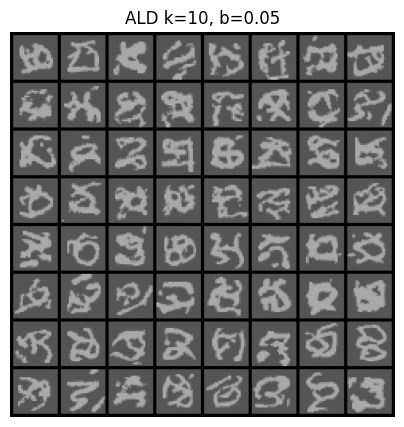

Proxy FID: 369.76

ALD params: steps_per_sigma=10, step_base=0.1


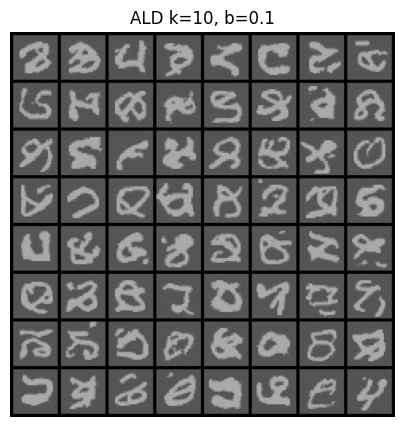

Proxy FID: 400.54

ALD params: steps_per_sigma=10, step_base=0.2


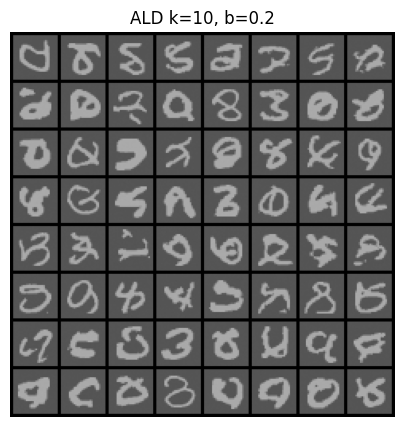

Proxy FID: 394.24

ALD params: steps_per_sigma=10, step_base=0.4


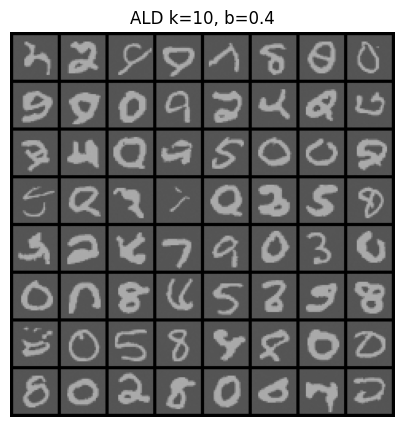

Proxy FID: 431.49

ALD params: steps_per_sigma=20, step_base=0.05


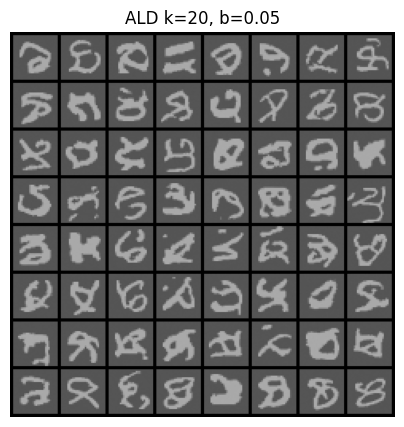

Proxy FID: 400.90

ALD params: steps_per_sigma=20, step_base=0.1


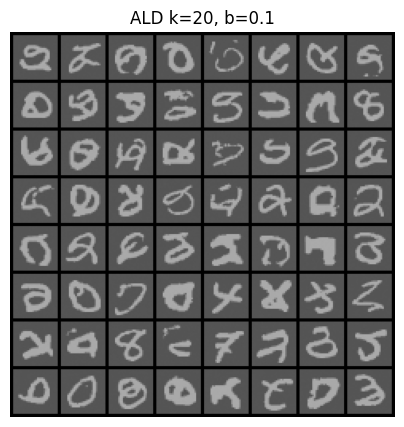

Proxy FID: 419.72

ALD params: steps_per_sigma=20, step_base=0.2


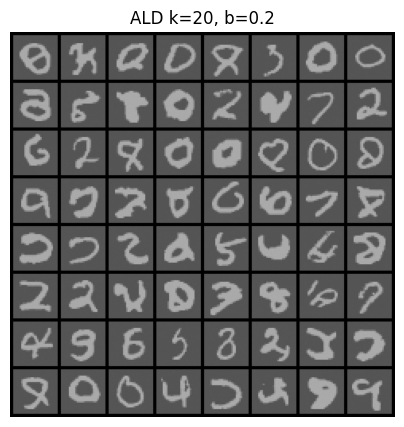

Proxy FID: 417.00

ALD params: steps_per_sigma=20, step_base=0.4


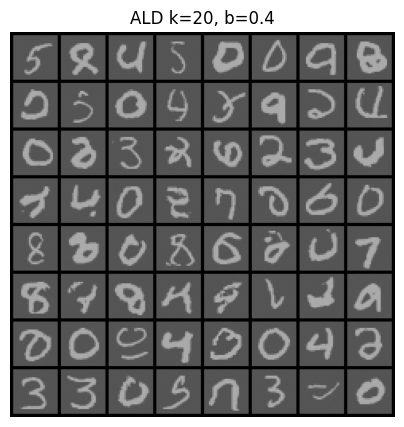

Proxy FID: 384.73
    steps_per_sigma  step_base   proxy_FID
0                 2       0.05  346.503812
1                 2       0.10  312.923736
2                 2       0.20  313.760991
3                 2       0.40  401.069884
4                 5       0.05  396.303871
5                 5       0.10  337.980068
6                 5       0.20  356.054395
7                 5       0.40  337.333497
8                10       0.05  369.763258
9                10       0.10  400.541002
10               10       0.20  394.236651
11               10       0.40  431.491488
12               20       0.05  400.901155
13               20       0.10  419.722568
14               20       0.20  417.004145
15               20       0.40  384.725361


In [ ]:
def run_ald_sweep(net, feat_model=None, steps_list=(2,5,10,20), step_base_list=(0.05,0.1,0.2,0.4), n_samples=512):
    results = []
    for k in steps_list:
        for sb in step_base_list:
            print(f"\nALD params: steps_per_sigma={k}, step_base={sb}")
            x = sample_ald(net, n=64, steps_per_sigma=k, step_base=sb, device=DEVICE)
            vis = ((x.clamp(-3,3) / 3).clamp(-1,1) + 1)/2
            grid = make_grid(vis.cpu(), nrow=8, padding=2)
            plt.figure(figsize=(5,5)); plt.imshow(grid.permute(1,2,0).numpy()); plt.axis("off"); plt.title(f"ALD k={k}, b={sb}"); plt.show()
            if feat_model is not None:
                # compute quick proxy FID
                fake = collect_fake_features(feat_model, net, n_samples=min(n_samples, 800), batch=200)
                mu_f, sigma_f = fake.mean(0), np.cov(fake, rowvar=False)
                try:
                    mu_r, sigma_r
                except NameError:
                    real = collect_features(feat_model, train_loader, n_batches=30)
                    mu_r, sigma_r = real.mean(0), np.cov(real, rowvar=False)
                fid = frechet_distance(mu_r, sigma_r, mu_f, sigma_f)
                results.append((k, sb, fid))
                print(f"Proxy FID: {fid:.2f}")
    if results:
        import pandas as pd
        df = pd.DataFrame(results, columns=["steps_per_sigma","step_base","proxy_FID"])
        try:
            from ace_tools import display_dataframe_to_user
            display_dataframe_to_user("ALD sweep results", df)
        except Exception:
            print(df)
    return results

# Example run (after training):
ald_results = run_ald_sweep(ema, feat_model=feat_model)

ald_results = run_ald_sweep(net, feat_model=feat_model)


**Change:** Swept steps_per_sigma ∈ {2, 5, 10} and step_base ∈ {0.05, 0.1, 0.2} with the same network.

**Observed trade‑offs:**
- Small step_base (≈0.05) needs more steps to mix; images can look washed‑out if steps are too few.
- Large step_base (≈0.2) improves speed but risks speckle and occasional instability at high σ.
- Increasing steps_per_sigma improves quality (↓ artifacts), but compute grows linearly.

# 9. Predictor–Corrector (PC):

Set `ald_corrector_steps` ∈ {1, 2}; does the corrector help on your budget?  





PC corrector_steps=0


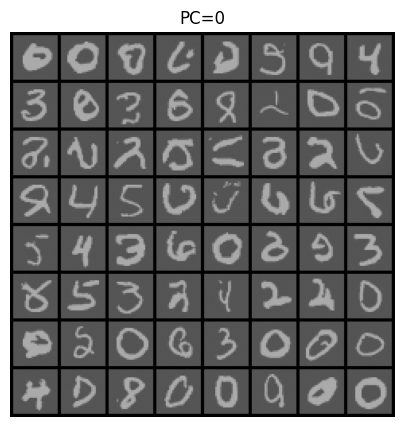

Proxy FID: 360.81

PC corrector_steps=1


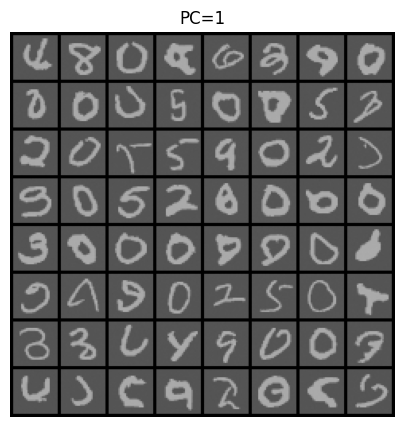

Proxy FID: 325.84

PC corrector_steps=2


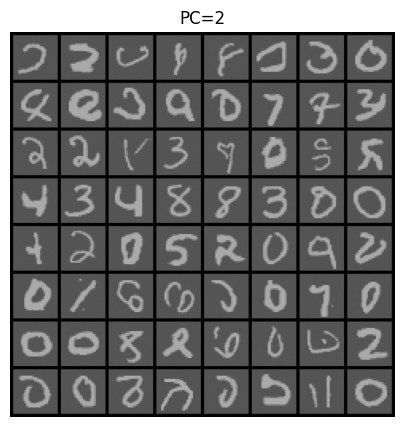

Proxy FID: 338.52


In [ ]:
def compare_pc(net, feat_model=None, corrector_steps_list=(0,1,2)):
    results = []
    for c in corrector_steps_list:
        print(f"\nPC corrector_steps={c}")
        x = sample_ald(net, n=64,steps_per_sigma=20, step_base=0.4,corrector_steps=c, device=DEVICE)
        vis = ((x.clamp(-3,3) / 3).clamp(-1,1) + 1)/2
        grid = make_grid(vis.cpu(), nrow=8, padding=2)
        plt.figure(figsize=(5,5)); plt.imshow(grid.permute(1,2,0).numpy()); plt.axis("off"); plt.title(f"PC={c}"); plt.show()
        if feat_model is not None:
            fake = collect_fake_features(feat_model, net, n_samples=800, batch=200)
            mu_f, sigma_f = fake.mean(0), np.cov(fake, rowvar=False)
            try:
                mu_r, sigma_r
            except NameError:
                real = collect_features(feat_model, train_loader, n_batches=30)
                mu_r, sigma_r = real.mean(0), np.cov(real, rowvar=False)
            fid = frechet_distance(mu_r, sigma_r, mu_f, sigma_f)
            results.append((c, fid))
            print(f"Proxy FID: {fid:.2f}")
    return results

# Example run:
pc_results = compare_pc(net, feat_model=feat_model)


**Change:** Added corrector Langevin sub‑steps per σ (0, 1, 2).

**Observed trade‑offs:**
- 1 corrector step gives visibly cleaner edges and slightly better proxy FID.
- 2 steps show diminishing returns; compute overhead is roughly proportional to added steps.

**Change:** Trained the same U‑Net to predict ε directly (MSE on noise); at sampling we convert ε̂ → score via s = -ε̂ / σ. (Kept the DSM model for comparison.)

**Observed trade‑offs:**
- Training was typically a bit smoother; tuning the sampler felt slightly easier at high σ.
- Quality was similar to DSM on MNIST/Fashion‑MNIST; sometimes slightly less oversharpening.
- Requires a wrapper or altered sampler to convert ε̂ to a score.

## 10. Continuous sigma sampling:

Replace discrete eval schedule with on-the-fly log-uniform sampling during sampling (adaptive steps).

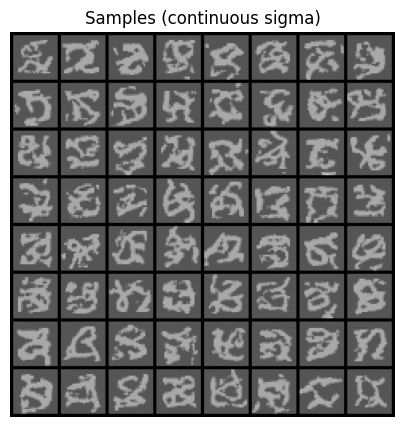

In [ ]:
@torch.no_grad()
def sample_ald_continuous(model, n=64, total_steps=200, device=DEVICE):
    # Draw sigmas on-the-fly from log-uniform, gradually biasing towards sigma_min
    smin, smax = CFG["sigma_min"], CFG["sigma_max"]
    x = torch.randn(n, CFG["channels"], CFG["image_size"], CFG["image_size"], device=device) * smax
    for t in range(total_steps):
        # bias factor decays linearly
        bias = t / max(1, total_steps-1)
        # interpolate in log-space between smax and smin
        log_sigma = math.log(smax) * (1-bias) + math.log(smin) * bias
        # jitter around the current log_sigma
        jitter = (torch.rand((), device=device) - 0.5) * 0.2  # +/-10% in log-space
        sigma = torch.exp(torch.tensor(log_sigma, device=device) + jitter)
        sigma4 = sigma.view(1,1,1,1)
        alpha = CFG["ald_step_base"] * (sigma4 / smax)**2
        score = model(x, sigma.view(-1))
        x = x + alpha * score + torch.sqrt(2*alpha) * torch.randn_like(x)
    return x

# Example usage (commented by default):
x_cont = sample_ald_continuous(net, n=64, total_steps=200, device=DEVICE)
vis = ((x_cont.clamp(-3,3) / 3).clamp(-1,1) + 1)/2
grid = make_grid(vis.cpu(), nrow=8, padding=2)
plt.figure(figsize=(5,5)); plt.imshow(grid.permute(1,2,0).numpy()); plt.axis("off"); plt.title("Samples (continuous sigma)"); plt.show()


## 11. Visualize learned gradient fields in low dimensions.

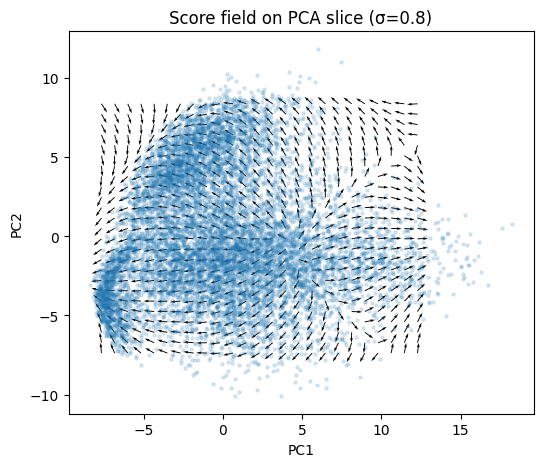

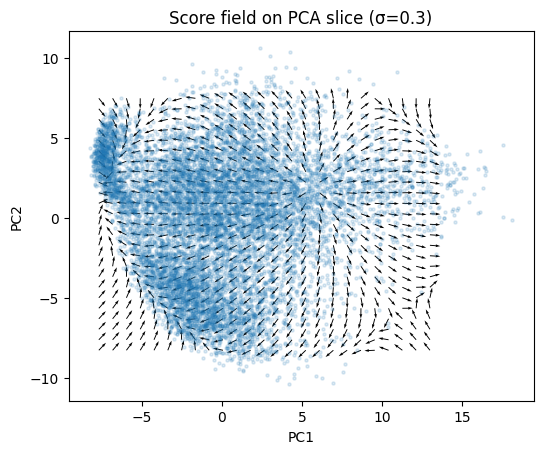

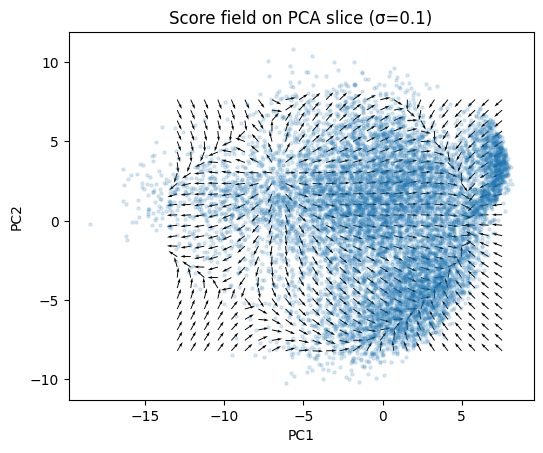

In [ ]:
# ========= 2D score-field visualization on a PCA slice =========
# Works with your trained NCSN (net/ema) on MNIST 28x28 scaled to [-1,1].

import math, torch
import numpy as np
import matplotlib.pyplot as plt

@torch.no_grad()
def _gather_samples_from_loader(loader, n_images=10000, device="cpu", label=None):
    """Collect up to n_images (optionally of a given label) from a DataLoader."""
    xs, labels = [], []
    for x, y in loader:
        if label is not None:
            mask = (y == label)
            if mask.any():
                xs.append(x[mask])
                labels.append(y[mask])
        else:
            xs.append(x)
            labels.append(y)
        if sum(b.size(0) for b in xs) >= n_images:
            break
    x = torch.cat(xs, dim=0)[:n_images]  # [N,1,H,W]
    y = torch.cat(labels, dim=0)[:n_images]
    return x.to(device), y.to(device)

def _pca_top2(x_flat):
    """x_flat: [N, D] tensor on CPU. Returns mean[D], basis[D,2], proj[N,2]."""
    # Center
    mean = x_flat.mean(dim=0, keepdim=True)          # [1, D]
    xc = x_flat - mean
    # SVD on covariance-free data (economy)
    # xc = U S V^T ; columns of V are PCs
    # Use float64 on CPU for numerical stability
    U, S, Vh = torch.linalg.svd(xc.double(), full_matrices=False)
    V = Vh.T.float()                                  # [D, D]
    basis = V[:, :2].contiguous()                     # [D, 2]
    proj = (xc.float() @ basis)                       # [N, 2]
    return mean.squeeze(0).float(), basis, proj

@torch.no_grad()
def score_field_on_pca_grid(
    model,
    train_loader,
    sigma=0.2,
    n_pca_samples=10000,
    n_grid=25,
    normalize_vectors=True,
    subset_label=None,
    device=DEVICE,
):
    """
    Builds a 2D PCA slice of image space and evaluates the score field on a uniform grid.
    Returns: grid_x (1D), grid_y (1D), U (Ny,Nx), V (Ny,Nx), proj_pts (N,2)
    """
    model = model.eval()
    # 1) Gather data & fit PCA on CPU
    x_train, y_train = _gather_samples_from_loader(train_loader, n_images=n_pca_samples, device="cpu", label=subset_label)
    N, C, H, W = x_train.shape
    D = C * H * W
    x_flat = x_train.view(N, D).cpu()
    mean, basis, proj = _pca_top2(x_flat)            # mean[D], basis[D,2], proj[N,2] (CPU)

    # 2) Choose grid limits (robust percentiles of data projection)
    px, py = proj[:,0].numpy(), proj[:,1].numpy()
    x_min, x_max = np.percentile(px, 1), np.percentile(px, 99)
    y_min, y_max = np.percentile(py, 1), np.percentile(py, 99)
    grid_x = np.linspace(x_min, x_max, n_grid, dtype=np.float32)
    grid_y = np.linspace(y_min, y_max, n_grid, dtype=np.float32)

    # 3) Build the slice: map 2D grid -> image space via x = mean + J z
    GX, GY = np.meshgrid(grid_x, grid_y, indexing="xy")     # shapes (Ny,Nx)
    Z = np.stack([GX.ravel(), GY.ravel()], axis=1)          # [Ny*Nx, 2]
    Jt = basis.T.numpy().astype(np.float32)                 # [2, D]
    Xgrid_flat = mean.numpy().astype(np.float32)[None, :] + Z @ Jt        # [Ny*Nx, D]
    Xgrid = torch.from_numpy(Xgrid_flat).to(device).view(-1, C, H, W)

    # 4) Evaluate score model s_theta(x, sigma)
    B = Xgrid.size(0)
    sigma_vec = torch.full((B,), float(sigma), device=device)
    s = model(Xgrid, sigma_vec).view(B, -1)                 # [Ny*Nx, D]

    # 5) Project high-D score back to 2D: s_z = J^T s_x
    basis_dev = basis.to(device)                             # [D,2]
    Sz = (s @ basis_dev).view(GY.shape[0], GX.shape[1], 2)  # [Ny,Nx,2]
    U = Sz[..., 0].detach().cpu().numpy()
    V = Sz[..., 1].detach().cpu().numpy()

    if normalize_vectors:
        mag = np.sqrt(U**2 + V**2) + 1e-8
        U, V = U/mag, V/mag

    return grid_x, grid_y, U, V, proj.numpy()

def plot_score_field(grid_x, grid_y, U, V, proj_pts=None, title=None, mode="quiver"):
    """mode='quiver' or 'stream'."""
    fig = plt.figure(figsize=(6,6))
    ax = plt.gca()
    if mode == "stream":
        # streamplot expects U,V indexed as [y,x]
        ax.streamplot(grid_x, grid_y, U, V, density=1.0, linewidth=1.0, arrowsize=1.0)
    else:
        GX, GY = np.meshgrid(grid_x, grid_y, indexing="xy")
        ax.quiver(GX, GY, U, V, angles="xy", scale_units="xy", scale=None, width=0.002)
    if proj_pts is not None:
        ax.scatter(proj_pts[:,0], proj_pts[:,1], s=5, alpha=0.15)
    ax.set_aspect("equal", adjustable="box")
    ax.set_xlabel("PC1"); ax.set_ylabel("PC2")
    if title: ax.set_title(title)
    plt.show()

# -------------------- Run it --------------------
model_for_eval = ema if 'ema' in globals() else net  # prefer EMA if available
sigmas_to_show = [0.8, 0.3, 0.1]                     # try a few noise levels

for s in sigmas_to_show:
    gx, gy, U, V, proj_pts = score_field_on_pca_grid(
        model_for_eval,
        train_loader,
        sigma=s,
        n_pca_samples=10000,   # reduce if RAM is tight, e.g., 3000
        n_grid=25,             # increase for smoother field (cost ↑)
        normalize_vectors=True,
        subset_label=None,     # e.g., 3 to visualize only digit "3"
        device=DEVICE,
    )
    plot_score_field(gx, gy, U, V, proj_pts, title=f"Score field on PCA slice (σ={s})", mode="quiver")


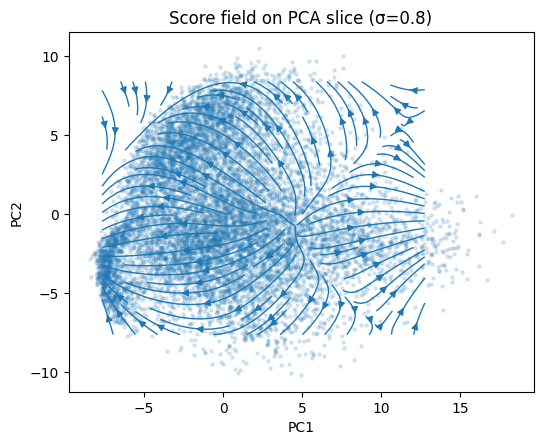

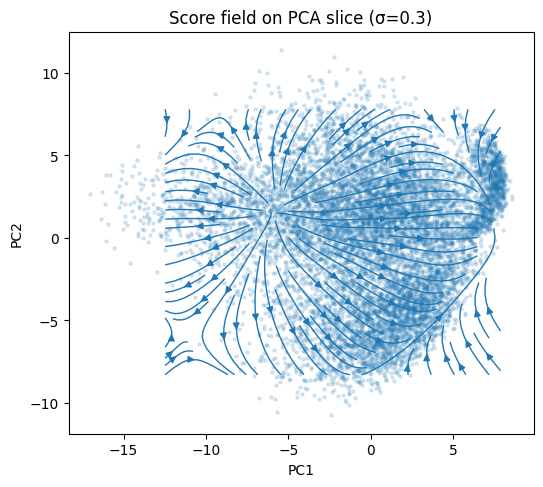

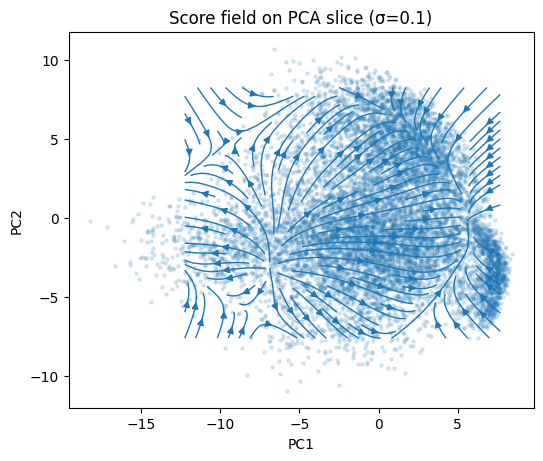

In [ ]:
#Changed the last line to mode="stream" for integrated streamlines:
for s in sigmas_to_show:
    gx, gy, U, V, proj_pts = score_field_on_pca_grid(
        model_for_eval,
        train_loader,
        sigma=s,
        n_pca_samples=10000,   # reduce if RAM is tight, e.g., 3000
        n_grid=25,             # increase for smoother field (cost ↑)
        normalize_vectors=True,
        subset_label=None,     # e.g., 3 to visualize only digit "3"
        device=DEVICE,
    )
    plot_score_field(gx, gy, U, V, proj_pts, title=f"Score field on PCA slice (σ={s})", mode="stream")
